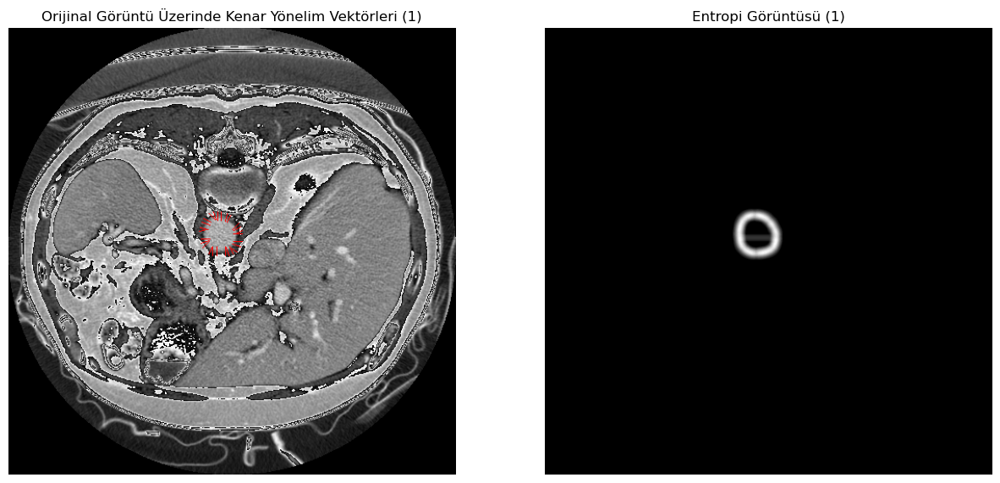

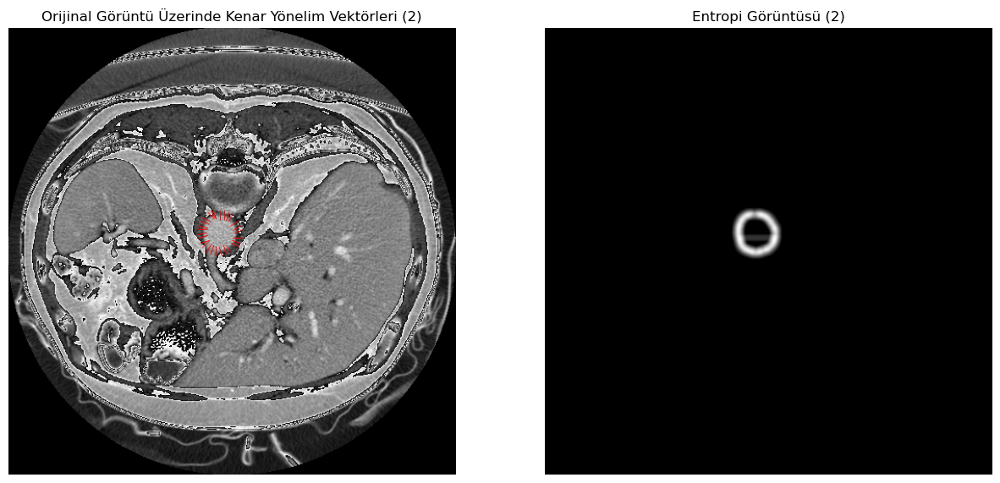

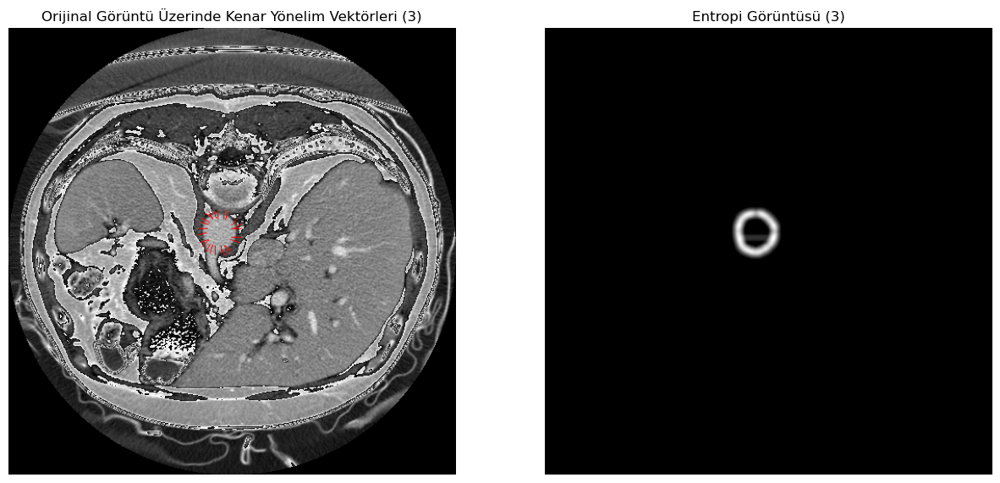

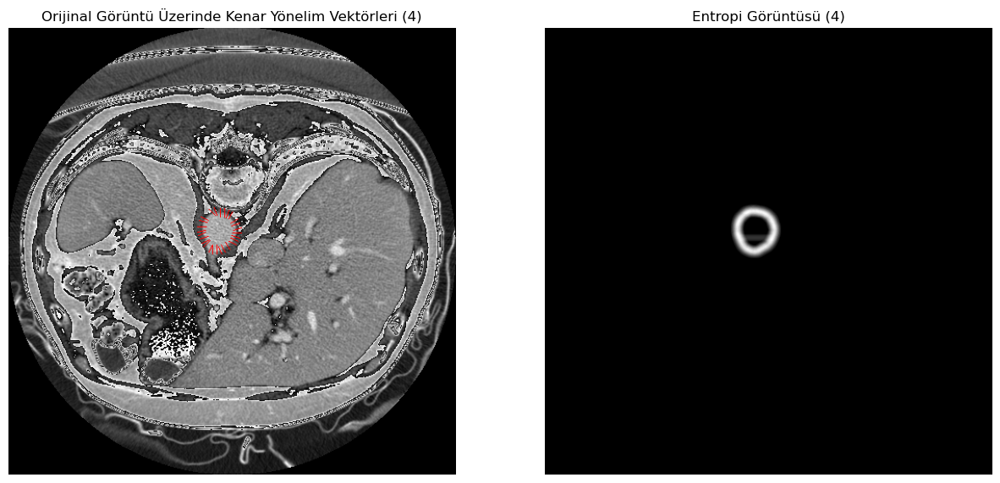

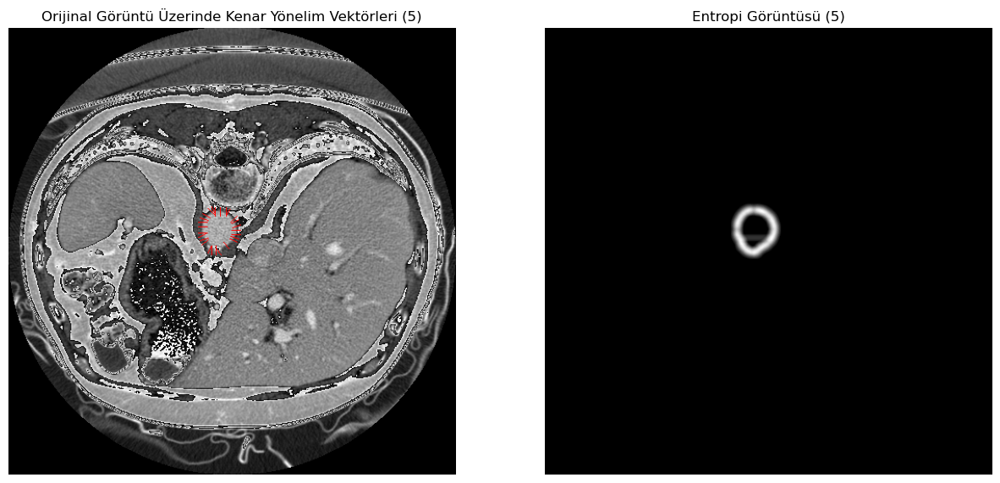

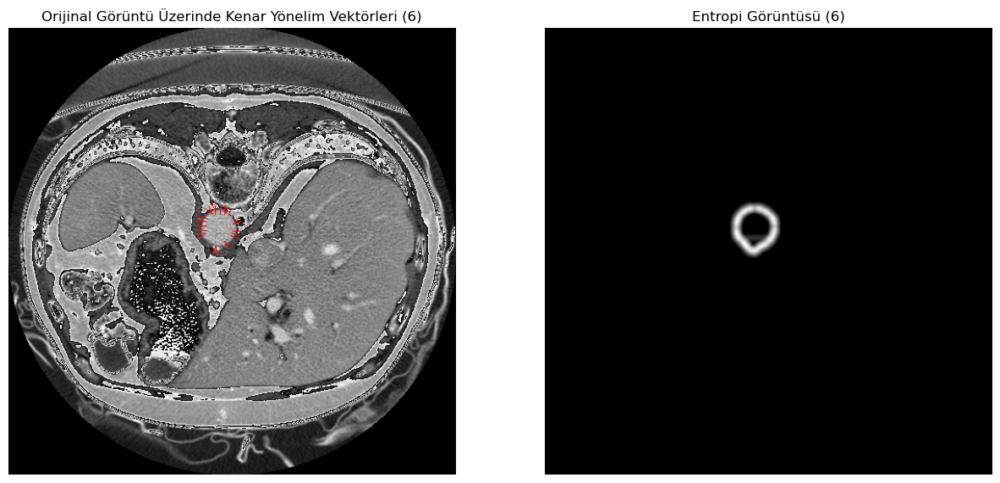

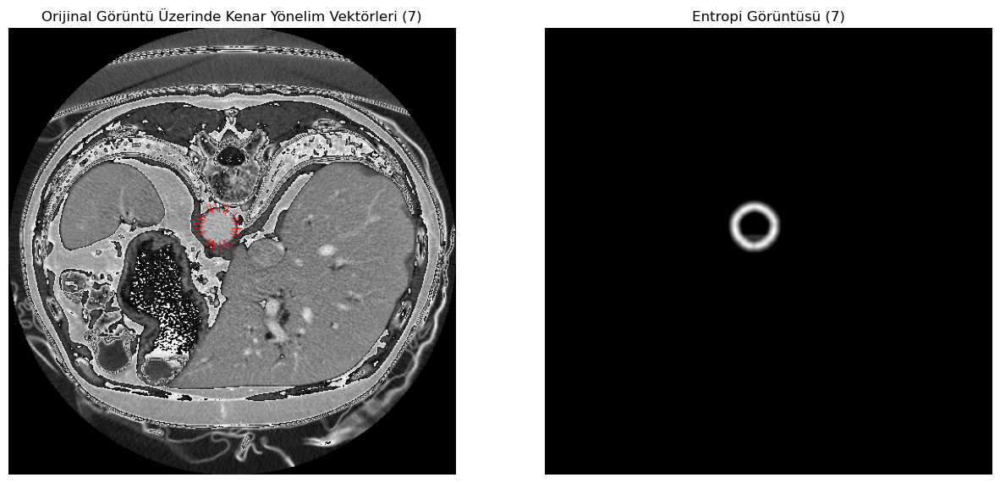

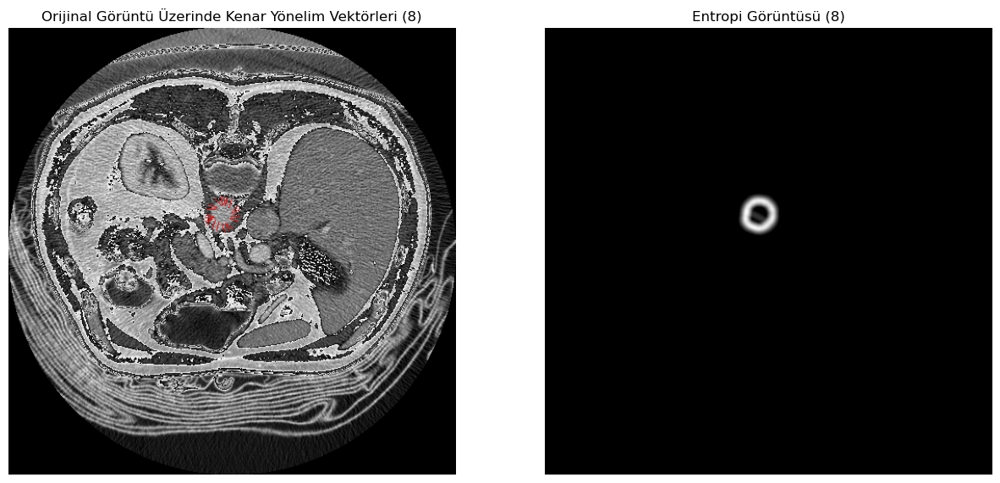

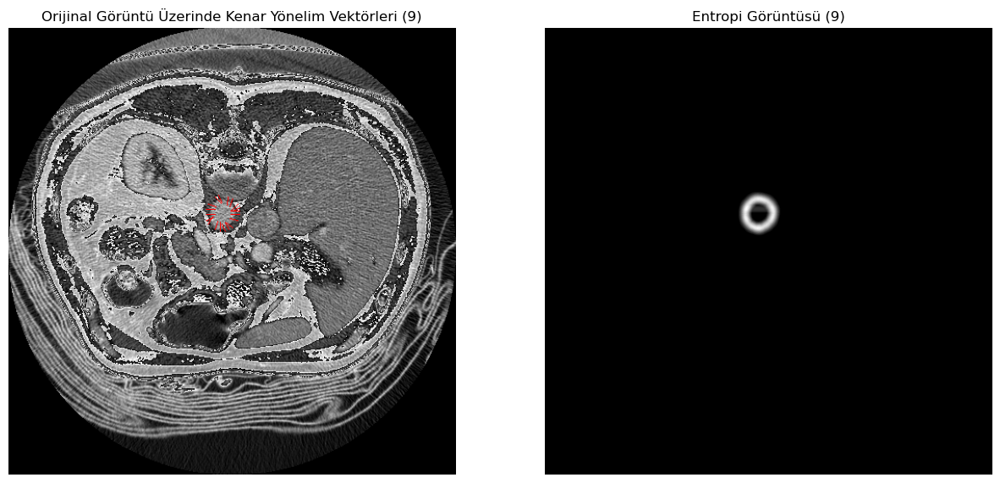

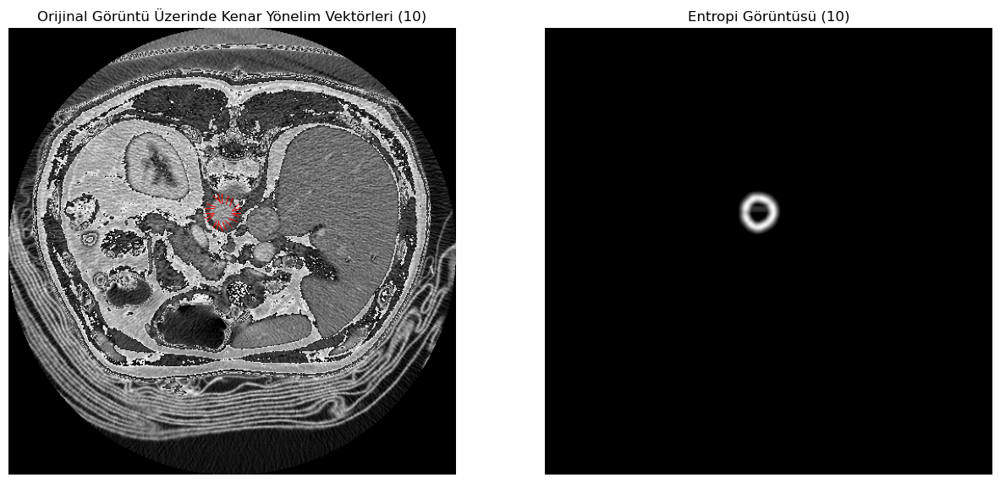

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import os

# 1. Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 10 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:10]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:10]

# 2. İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Normalizasyon
    label_img = label_img / 255.0  # 0-1 aralığında normalize

    # Gürültü Eliminasyonu (Medyan Filtreleme ve Gaussian Blur)
    label_img = cv2.medianBlur((label_img * 255).astype(np.uint8), 5)
    smoothed_img = cv2.GaussianBlur(label_img, (7, 7), 0)

    # Keskinleştirme (Laplace)
    laplacian = cv2.Laplacian(smoothed_img, cv2.CV_64F)
    sharpened_img = cv2.convertScaleAbs(smoothed_img - 0.7 * laplacian)

    # Adaptif Histogram Eşitleme
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized_img = clahe.apply((sharpened_img * 255).astype(np.uint8))

    # Entropi Hesaplama
    entropy_img = entropy(equalized_img, disk(5))

    # Kenar Tespiti (Canny)
    edges = cv2.Canny(equalized_img, 50, 150)

    # Kontur Bulma
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Kenar Yönelim Vektörlerini Orijinal Görüntüye Çizme
    for contour in contours:
        for i in range(0, len(contour), 4):  # 4 pikselde bir vektör çiz
            pt1 = contour[i][0]
            pt2 = contour[(i + 4) % len(contour)][0]

            # Vektör yönelimi hesaplama
            vec_x = pt2[0] - pt1[0]
            vec_y = pt2[1] - pt1[1]

            # Döndürülmüş vektör
            dx = int(-10 * np.cos(np.arctan2(vec_y, vec_x) + np.pi / 2))
            dy = int(-10 * np.sin(np.arctan2(vec_y, vec_x) + np.pi / 2))
            x_end = pt1[0] + dx
            y_end = pt1[1] + dy

            # Vektör çizimi (kırmızı renkli)
            cv2.line(original_img, tuple(pt1), (x_end, y_end), (255, 0, 0), 1)

    # Görselleştirme
    plt.figure(figsize=(15, 15))

    # Kenar Yönelim Vektörleri ile Orijinal Görüntü
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title(f"Orijinal Görüntü Üzerinde Kenar Yönelim Vektörleri ({idx + 1})")
    plt.axis('off')

    # Entropi Görüntüsü
    plt.subplot(1, 2, 2)
    plt.imshow(entropy_img, cmap='gray')
    plt.title(f"Entropi Görüntüsü ({idx + 1})")
    plt.axis('off')

    plt.show()


/var/folders/x4/4clmmtd53q30y140639dzwzh0000gn/T/ipykernel_10832/2104525919.py:128: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


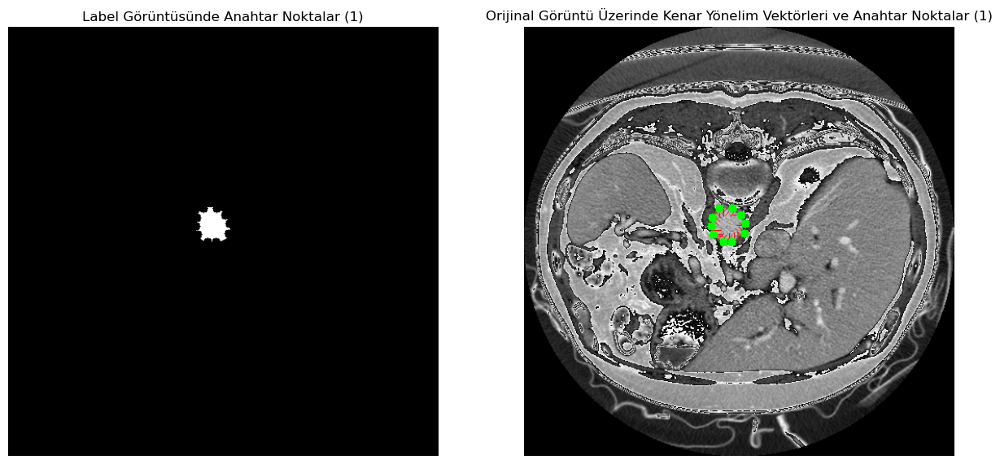

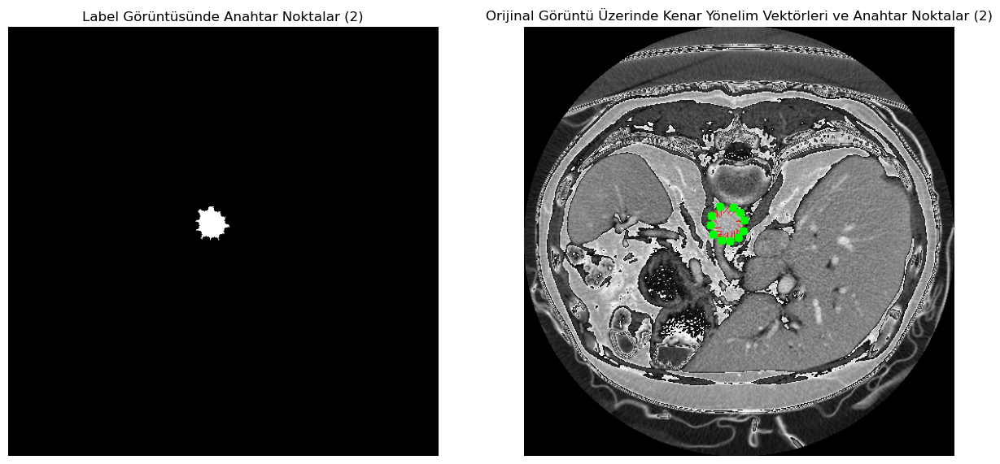

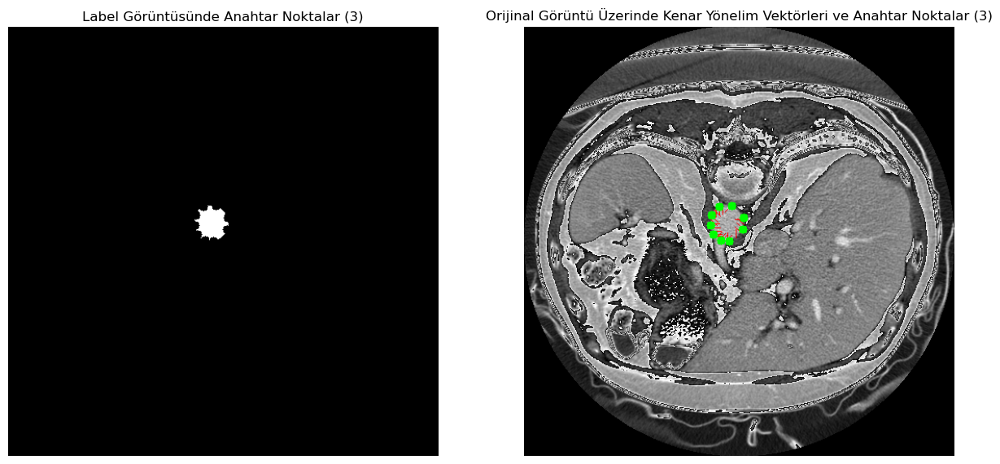

TypeError: Object of type int32 is not JSON serializable

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import os
import json
import base64

def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        # NumPy dizilerini listeye dönüştür
        return obj.tolist()
    elif isinstance(obj, np.generic):
        # NumPy sayısını Python sayısına dönüştür
        return obj.item()  # item() metoduyla NumPy türlerini Python türlerine dönüştür
    elif isinstance(obj, (int, float, str, bool)): 
        # Diğer temel veri türlerini olduğu gibi döndür
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")


def encode_image_to_base64(image):
    _, buffer = cv2.imencode('.png', image)
    image_base64 = base64.b64encode(buffer).decode('utf-8')
    return image_base64


# 1. Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# 2. İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Gürültü Eliminasyonu (Medyan Filtreleme ve Gaussian Blur)
    label_img = cv2.medianBlur(label_img, 5)
    smoothed_img = cv2.GaussianBlur(label_img, (7, 7), 0)

    # Keskinleştirme (Laplace)
    laplacian = cv2.Laplacian(smoothed_img, cv2.CV_64F)
    sharpened_img = cv2.convertScaleAbs(smoothed_img - 0.7 * laplacian)

    # Adaptif Histogram Eşitleme
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized_img = clahe.apply(sharpened_img)

    # Entropi Hesaplama
    entropy_img = entropy(equalized_img, disk(5))

    # Kenar Tespiti (Canny)
    edges = cv2.Canny(equalized_img, 50, 150)

    # Kontur Bulma
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Kenar Yönelim Vektörlerini Label İçindeki Alanlara Çizme (İçe Doğru)
    image_vectors = []
    keypoints = []  # Anahtar noktalar için liste
    for contour in contours:
        for i in range(0, len(contour), 1):  # Vektör sayısını arttırmak için adım 1'e düşürüldü
            pt1 = contour[i][0]
            pt2 = contour[(i + 1) % len(contour)][0]

            # Konturun label içinde olup olmadığını kontrol et
            if label_img[pt1[1], pt1[0]] > 0:  # Label içindeki noktalar
                # Vektör yönelimi hesaplama (içeri doğru)
                vec_x = pt2[0] - pt1[0]
                vec_y = pt2[1] - pt1[1]
                length = np.sqrt(vec_x**2 + vec_y**2)
                angle = np.arctan2(vec_y, vec_x) * 180 / np.pi

                # Curvature hesaplama (vektörlerin açılarındaki değişim)
                curvature = np.abs(angle - np.arctan2(vec_y, vec_x)) if len(image_vectors) > 0 else 0

                # Orientation (Zaten açıyı hesapladık)
                orientation = angle

                # Eksantriklik (Ağırlıklı yoğunluk, örneğin, bir elipsin eğrilik oranı gibi hesaplanabilir)
                eccentricity = length / (1 + np.sqrt(vec_x**2 + vec_y**2))

                # Yuvarlaklık Hesaplama
                perimeter = cv2.arcLength(contour, True)
                area = cv2.contourArea(contour)
                roundness = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0

                # Konveks Hull Alanı
                convex_hull = cv2.convexHull(contour)
                hull_area = cv2.contourArea(convex_hull)

                # Vektörü kaydetme
                image_vectors.append({
                    "length": length,
                    "angle": angle,
                    "curvature": curvature,
                    "orientation": orientation,
                    "eccentricity": eccentricity,
                    "roundness": roundness,
                    "hull_area": hull_area,
                    "start_point": tuple(pt1),
                    "end_point": tuple(pt2)
                })

                # Döndürülmüş ve tersine çevrilmiş vektör (içe doğru)
                dx = int(-10 * np.cos(np.arctan2(vec_y, vec_x) + np.pi / 2))
                dy = int(-10 * np.sin(np.arctan2(vec_y, vec_x) + np.pi / 2))
                x_end = pt1[0] + dx
                y_end = pt1[1] + dy

                # Vektör çizimi (kırmızı renkli)
                cv2.line(original_img, tuple(pt1), (x_end, y_end), (255, 0, 0), 1)

    # Anahtar Noktalarını Tespit Etme (Shi-Tomasi Corner Detection)
    corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
    if corners is not None:
        corners = np.int0(corners)
        for corner in corners:
            x, y = corner.ravel()
            keypoints.append({"x": int(x), "y": int(y)})
            # Anahtar noktasını çizme (label üzerinde)
            cv2.circle(label_img, (x, y), 5, (0, 255, 0), -1)
            # Anahtar noktasını orijinal görüntüde de çizme
            cv2.circle(original_img, (x, y), 5, (0, 255, 0), -1)

    # Görselleştirme
    plt.figure(figsize=(15, 15))

    # Label Görüntüsü üzerinde Anahtar Noktalar
    plt.subplot(1, 2, 1)
    plt.imshow(label_img, cmap='gray')
    plt.title(f"Label Görüntüsünde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar
    plt.subplot(1, 2, 2)
    plt.imshow(original_img)
    plt.title(f"Orijinal Görüntü Üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Vektör verilerini ekle
    data_to_save.append({
        "image_index": idx + 1,
        "vectors": image_vectors,
        "keypoints": keypoints,  # Anahtar noktalar ekle
        "label_img": encode_image_to_base64(label_img),  # Label görselini base64 ile kaydet
        "original_img": encode_image_to_base64(original_img)  # Orijinal görselini base64 ile kaydet
    })

# Vektör verilerini JSON dosyasına kaydetme
with open("vector_properties_with_keypoints.json", "w") as f:
    json.dump(data_to_save, f, indent=4)


/var/folders/x4/4clmmtd53q30y140639dzwzh0000gn/T/ipykernel_10832/1754137672.py:117: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


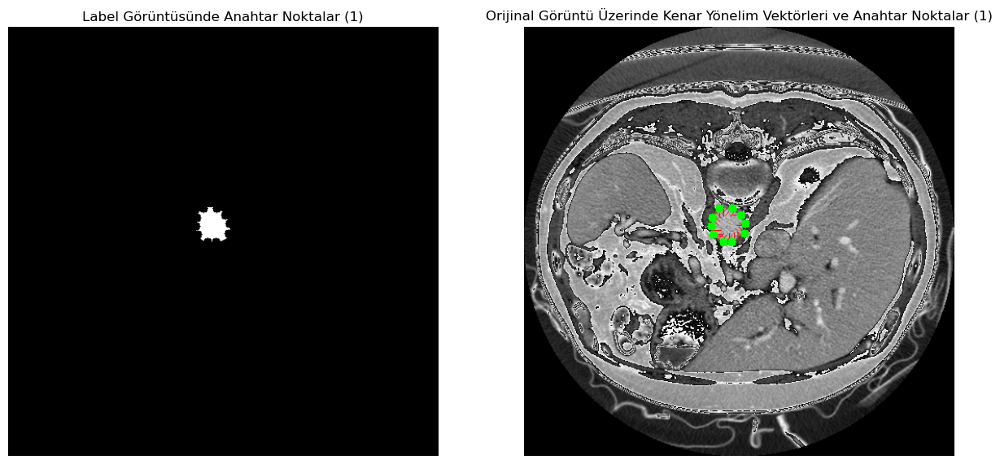

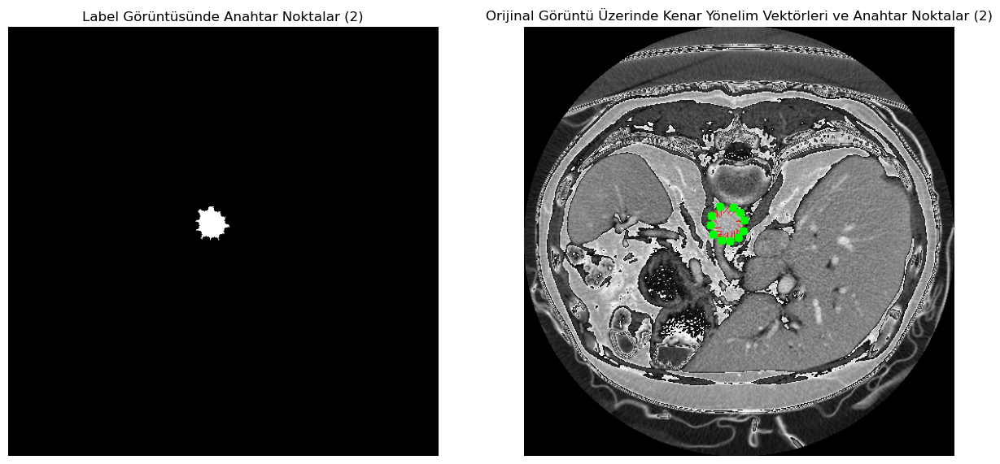

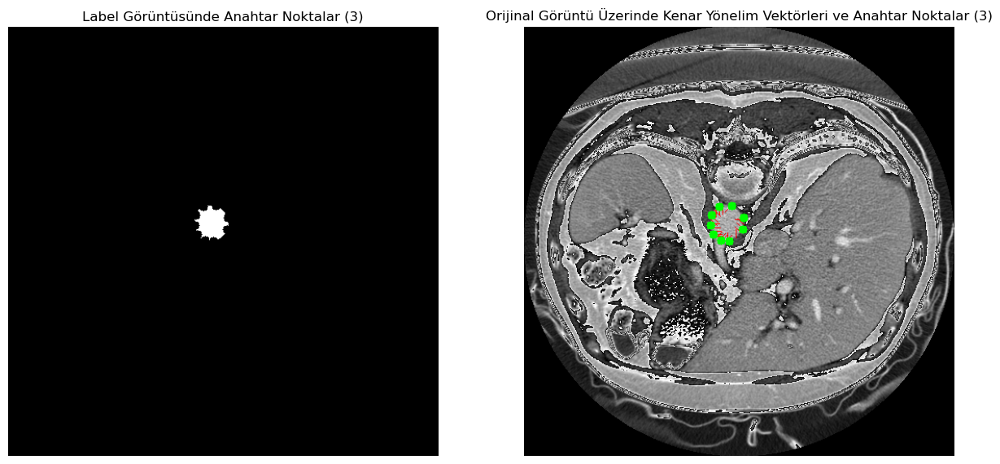

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import os
import json

def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Gürültü Eliminasyonu
    label_img = cv2.medianBlur(label_img, 5)
    smoothed_img = cv2.GaussianBlur(label_img, (7, 7), 0)

    # Keskinleştirme
    laplacian = cv2.Laplacian(smoothed_img, cv2.CV_64F)
    sharpened_img = cv2.convertScaleAbs(smoothed_img - 0.7 * laplacian)

    # Adaptif Histogram Eşitleme
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized_img = clahe.apply(sharpened_img)

    # Entropi Hesaplama
    entropy_img = entropy(equalized_img, disk(5))

    # Kenar Tespiti (Canny)
    edges = cv2.Canny(equalized_img, 50, 150)

    # Kontur Bulma
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Kenar Yönelim Vektörlerini Label İçindeki Alanlara Çizme
    image_vectors = []
    keypoints = []  # Anahtar noktalar için liste
    for contour in contours:
        for i in range(0, len(contour), 1):  
            pt1 = contour[i][0]
            pt2 = contour[(i + 1) % len(contour)][0]

            # Konturun label içinde olup olmadığını kontrol et
            if label_img[pt1[1], pt1[0]] > 0:  
                # Vektör yönelimi hesaplama (içeri doğru)
                vec_x = pt2[0] - pt1[0]
                vec_y = pt2[1] - pt1[1]
                length = np.sqrt(vec_x**2 + vec_y**2)
                angle = np.arctan2(vec_y, vec_x) * 180 / np.pi

                # Curvature hesaplama (vektörlerin açılarındaki değişim)
                curvature = np.abs(angle - np.arctan2(vec_y, vec_x)) if len(image_vectors) > 0 else 0

                # Orientation (Açıyı hesapladık)
                orientation = angle

                # Eksantriklik
                eccentricity = length / (1 + np.sqrt(vec_x**2 + vec_y**2))

                # Yuvarlaklık Hesaplama
                perimeter = cv2.arcLength(contour, True)
                area = cv2.contourArea(contour)
                roundness = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0

                # Konveks Hull Alanı
                convex_hull = cv2.convexHull(contour)
                hull_area = cv2.contourArea(convex_hull)

                # Vektörü kaydetme
                image_vectors.append({
                    "length": length,
                    "angle": angle,
                    "curvature": curvature,
                    "orientation": orientation,
                    "eccentricity": eccentricity,
                    "roundness": roundness,
                    "hull_area": hull_area,
                    "start_point": tuple(pt1),
                    "end_point": tuple(pt2)
                })

                # Döndürülmüş ve tersine çevrilmiş vektör (içe doğru)
                dx = int(-10 * np.cos(np.arctan2(vec_y, vec_x) + np.pi / 2))
                dy = int(-10 * np.sin(np.arctan2(vec_y, vec_x) + np.pi / 2))
                x_end = pt1[0] + dx
                y_end = pt1[1] + dy

                # Vektör çizimi (kırmızı renkli)
                cv2.line(original_img, tuple(pt1), (x_end, y_end), (255, 0, 0), 1)

    # Anahtar Noktalarını Tespit Etme
    corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
    if corners is not None:
        corners = np.int0(corners)
        for corner in corners:
            x, y = corner.ravel()
            keypoints.append({"x": int(x), "y": int(y)})
            # Anahtar noktasını çizme (label üzerinde)
            cv2.circle(label_img, (x, y), 5, (0, 255, 0), -1)
            # Anahtar noktasını orijinal görüntüde de çizme
            cv2.circle(original_img, (x, y), 5, (0, 255, 0), -1)

    # Görselleştirme
    plt.figure(figsize=(15, 15))

    # Label Görüntüsü üzerinde Anahtar Noktalar
    plt.subplot(1, 2, 1)
    plt.imshow(label_img, cmap='gray')
    plt.title(f"Label Görüntüsünde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar
    plt.subplot(1, 2, 2)
    plt.imshow(original_img)
    plt.title(f"Orijinal Görüntü Üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Vektör verilerini ekle
    data_to_save.append({
        "image_index": idx + 1,
        "vectors": image_vectors,
        "keypoints": keypoints,  # Anahtar noktalar ekle
        "label_img": numpy_to_json_compatible(label_img),  # NumPy array'ini JSON uyumlu hale dönüştür
        "original_img": numpy_to_json_compatible(original_img)  # NumPy array'ini JSON uyumlu hale dönüştür
    })




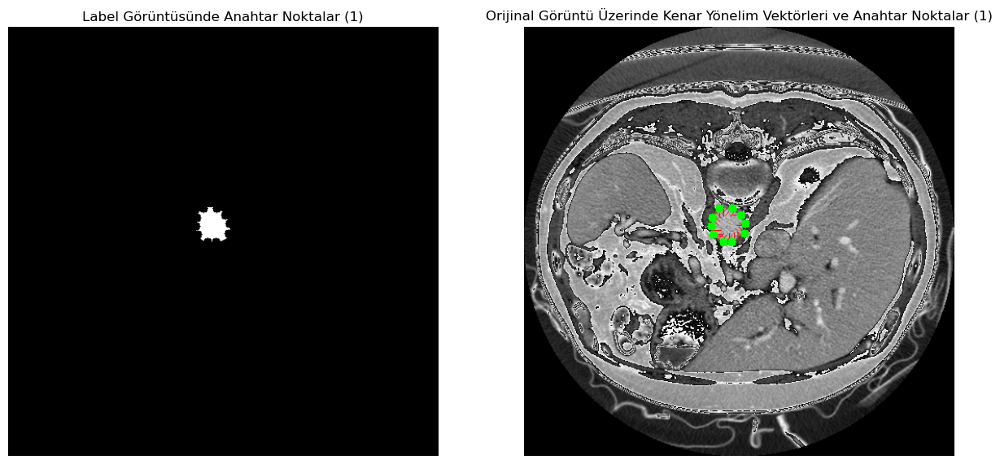

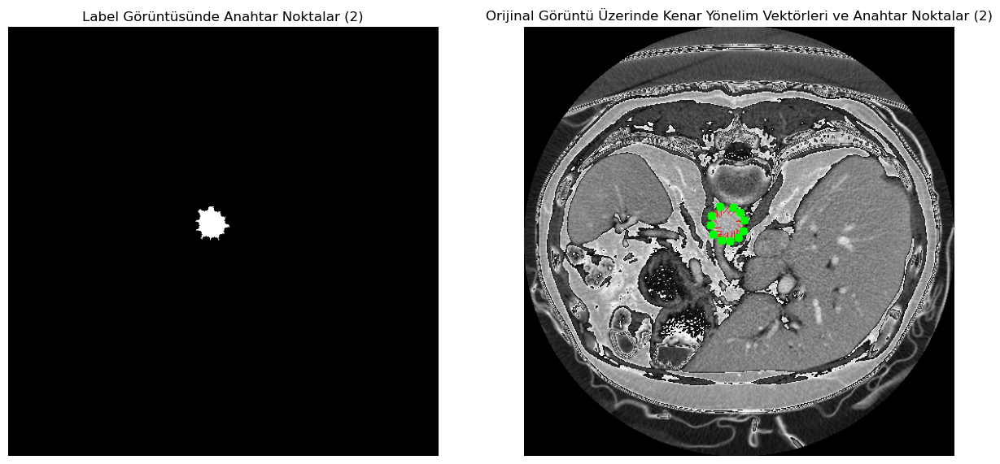

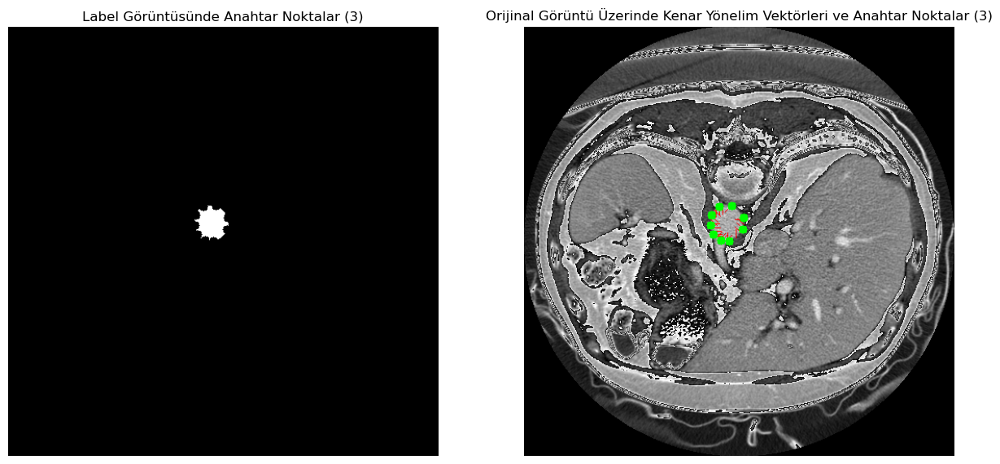

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters.rank import entropy
from skimage.morphology import disk
import os
import json

def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

    # Gürültü Eliminasyonu
    label_img = cv2.medianBlur(label_img, 5)
    smoothed_img = cv2.GaussianBlur(label_img, (7, 7), 0)

    # Keskinleştirme
    laplacian = cv2.Laplacian(smoothed_img, cv2.CV_64F)
    sharpened_img = cv2.convertScaleAbs(smoothed_img - 0.7 * laplacian)

    # Adaptif Histogram Eşitleme
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    equalized_img = clahe.apply(sharpened_img)

    # Entropi Hesaplama
    entropy_img = entropy(equalized_img, disk(5))

    # Kenar Tespiti (Canny)
    edges = cv2.Canny(equalized_img, 50, 150)

    # Kontur Bulma
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Kenar Yönelim Vektörlerini Label İçindeki Alanlara Çizme
    image_vectors = []
    keypoints = []  # Anahtar noktalar için liste
    for contour in contours:
        for i in range(0, len(contour), 1):  
            pt1 = contour[i][0]
            pt2 = contour[(i + 1) % len(contour)][0]

            # Konturun label içinde olup olmadığını kontrol et
            if label_img[pt1[1], pt1[0]] > 0:  
                # Vektör yönelimi hesaplama (içeri doğru)
                vec_x = pt2[0] - pt1[0]
                vec_y = pt2[1] - pt1[1]
                length = np.sqrt(vec_x**2 + vec_y**2)
                angle = np.arctan2(vec_y, vec_x) * 180 / np.pi

                # Curvature hesaplama (vektörlerin açılarındaki değişim)
                curvature = np.abs(angle - np.arctan2(vec_y, vec_x)) if len(image_vectors) > 0 else 0

                # Orientation (Açıyı hesapladık)
                orientation = angle

                # Eksantriklik
                eccentricity = length / (1 + np.sqrt(vec_x**2 + vec_y**2))

                # Yuvarlaklık Hesaplama
                perimeter = cv2.arcLength(contour, True)
                area = cv2.contourArea(contour)
                roundness = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0

                # Konveks Hull Alanı
                convex_hull = cv2.convexHull(contour)
                hull_area = cv2.contourArea(convex_hull)

                # Vektörü kaydetme
                image_vectors.append({
                    "length": length,
                    "angle": angle,
                    "curvature": curvature,
                    "orientation": orientation,
                    "eccentricity": eccentricity,
                    "roundness": roundness,
                    "hull_area": hull_area,
                    "start_point": tuple(pt1),
                    "end_point": tuple(pt2)
                })

                # Döndürülmüş ve tersine çevrilmiş vektör (içe doğru)
                dx = int(-10 * np.cos(np.arctan2(vec_y, vec_x) + np.pi / 2))
                dy = int(-10 * np.sin(np.arctan2(vec_y, vec_x) + np.pi / 2))
                x_end = pt1[0] + dx
                y_end = pt1[1] + dy

                # Vektör çizimi (kırmızı renkli)
                cv2.line(original_img, tuple(pt1), (x_end, y_end), (255, 0, 0), 1)

    # Anahtar Noktalarını Tespit Etme
    corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
    if corners is not None:
        corners = np.intp(corners)  # np.int0 yerine np.intp kullandık
        for corner in corners:
            x, y = corner.ravel()
            keypoints.append({"x": int(x), "y": int(y)})
            # Anahtar noktasını çizme (label üzerinde)
            cv2.circle(label_img, (x, y), 5, (0, 255, 0), -1)
            # Anahtar noktasını orijinal görüntüde de çizme
            cv2.circle(original_img, (x, y), 5, (0, 255, 0), -1)

    # Görselleştirme
    plt.figure(figsize=(15, 15))

    # Label Görüntüsü üzerinde Anahtar Noktalar
    plt.subplot(1, 2, 1)
    plt.imshow(label_img, cmap='gray')
    plt.title(f"Label Görüntüsünde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar
    plt.subplot(1, 2, 2)
    plt.imshow(original_img)
    plt.title(f"Orijinal Görüntü Üzerinde Kenar Yönelim Vektörleri ve Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Vektör verilerini ekle
    data_to_save.append({
        "image_index": idx + 1,
        "vectors": image_vectors,
        "keypoints": keypoints,  # Anahtar noktalar ekle
        "label_img": numpy_to_json_compatible(label_img),  # NumPy array'ini JSON uyumlu hale dönüştür
        "original_img": numpy_to_json_compatible(original_img)  # NumPy array'ini JSON uyumlu hale dönüştür
    })


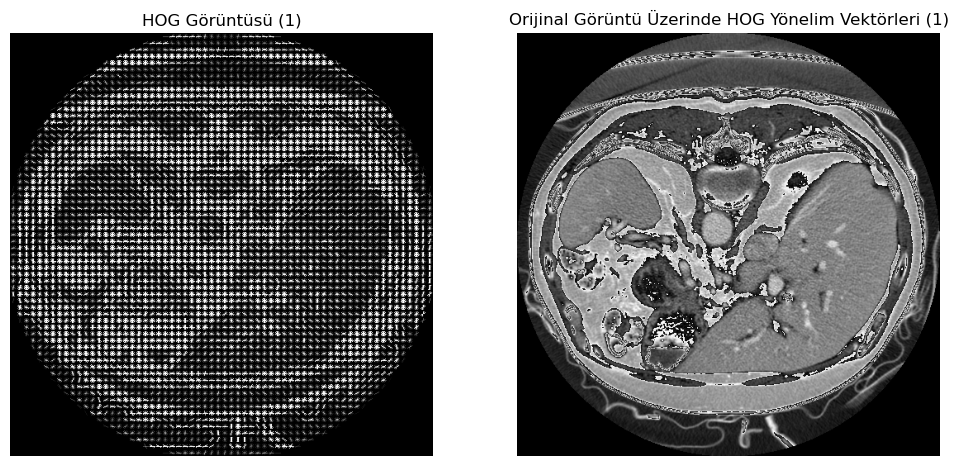

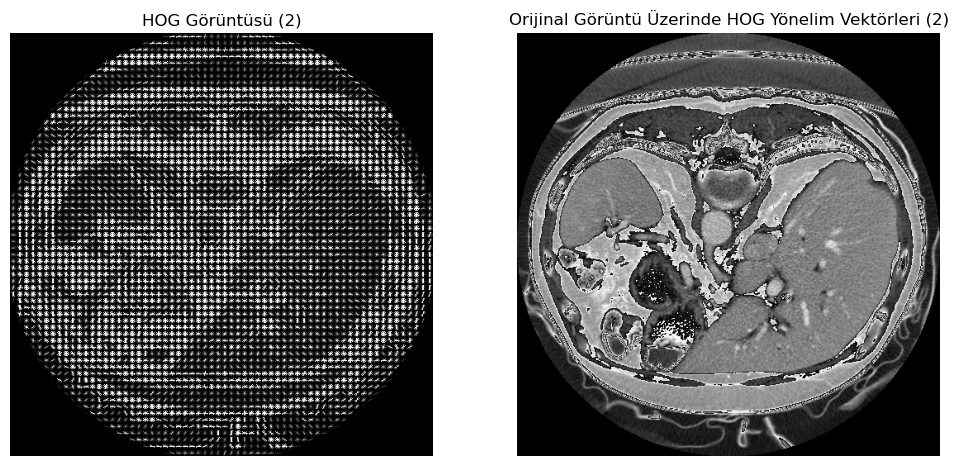

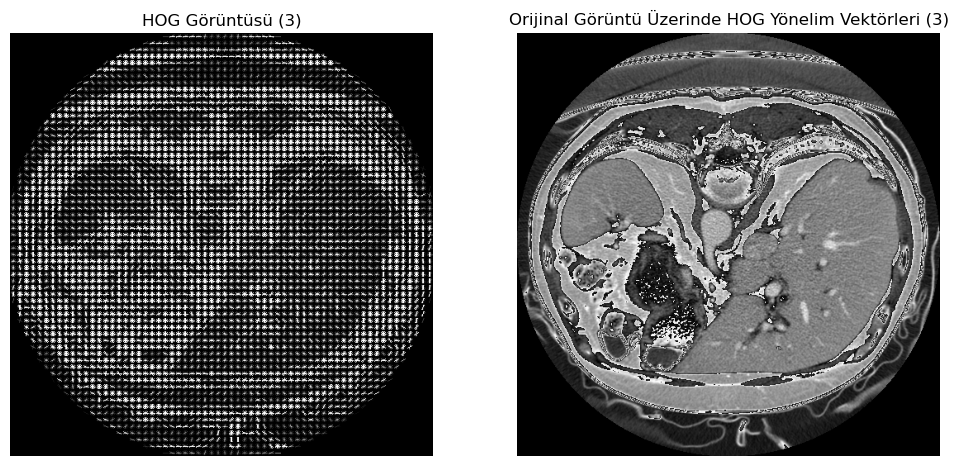

Veriler başarıyla kaydedildi: /Users/muzaffernergiz/Desktop/hog_features.json


In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from skimage.feature import hog
from skimage import exposure

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)

    # Renkli görüntüyü gri tonlamalıya çevir
    original_gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

    # HOG Özellikleri Hesaplama
    fd, hog_image = hog(original_gray_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

    # HOG Görüntüsünü iyileştirme (daha net görmek için)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # HOG Görüntüsünü Görselleştirme
    plt.figure(figsize=(12, 12))

    # HOG Görüntüsünü görselleştirme
    plt.subplot(1, 2, 1)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title(f"HOG Görüntüsü ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Anahtar Noktalar ve HOG Görüntüsü
    plt.subplot(1, 2, 2)
    plt.imshow(original_img)
    plt.title(f"Orijinal Görüntü Üzerinde HOG Yönelim Vektörleri ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Verileri kaydetme
    data_to_save.append({
        "image_index": idx + 1,
        "hog_features": fd.tolist(),  # HOG özelliklerini liste formatına çevir
        "hog_image": numpy_to_json_compatible(hog_image_rescaled),  # HOG görüntüsünü JSON uyumlu hale getir
        "label_img": numpy_to_json_compatible(label_img),  # Label görüntüsünü JSON uyumlu hale getir
        "original_img": numpy_to_json_compatible(original_img)  # Orijinal görüntüyü JSON uyumlu hale getir
    })

# Verileri HDD'ye JSON olarak kaydetme
output_path = "/Users/muzaffernergiz/Desktop/hog_features.json"
with open(output_path, 'w') as f:
    json.dump(data_to_save, f, indent=4)

print(f"Veriler başarıyla kaydedildi: {output_path}")


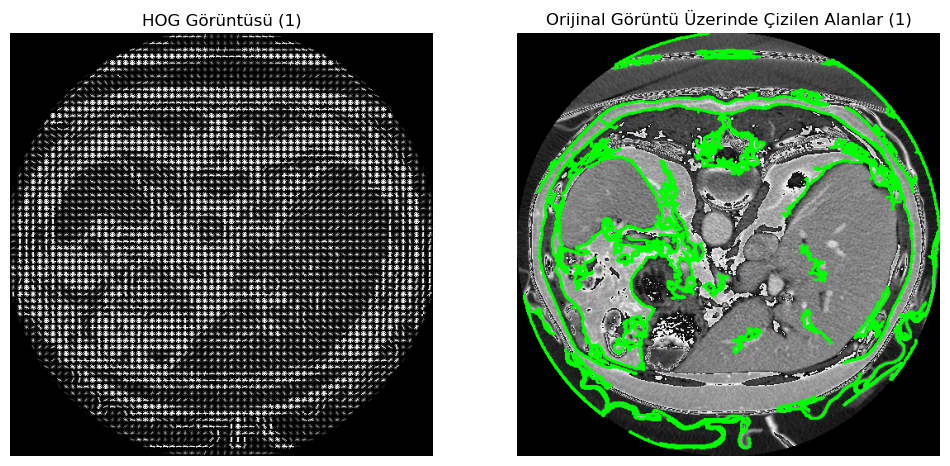

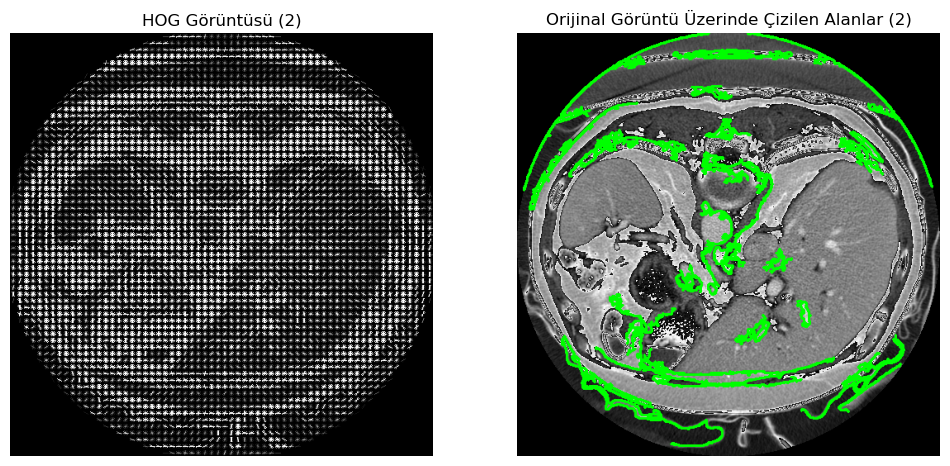

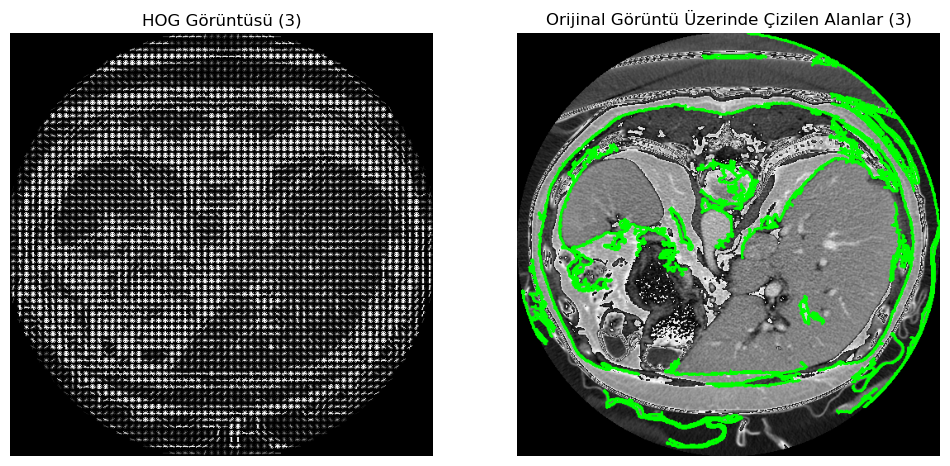

Veriler başarıyla kaydedildi: /Users/muzaffernergiz/Desktop/hog_features_with_contours.json


In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from skimage.feature import hog
from skimage import exposure

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)

    # Renkli görüntüyü gri tonlamalıya çevir
    original_gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

    # HOG Özellikleri Hesaplama
    fd, hog_image = hog(original_gray_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

    # HOG Görüntüsünü iyileştirme (daha net görmek için)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # Canny Kenar Tespiti
    edges = cv2.Canny(original_gray_img, 100, 200)

    # Konturları tespit etme (bulduğumuz kenarları belirlemek)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Bulunan alanları çizme
    for contour in contours:
        if cv2.contourArea(contour) > 100:  # Küçük alanları yoksaymak için
            cv2.drawContours(original_img, [contour], -1, (0, 255, 0), 2)  # Bulunan alanı yeşil renk ile çiz

    # Görselleştirme
    plt.figure(figsize=(12, 12))

    # HOG Görüntüsünü görselleştirme
    plt.subplot(1, 2, 1)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title(f"HOG Görüntüsü ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Kenarları Çizme
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))  # Renkli görüntüde çizilen alanları göster
    plt.title(f"Orijinal Görüntü Üzerinde Çizilen Alanlar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Verileri kaydetme
    data_to_save.append({
        "image_index": idx + 1,
        "hog_features": fd.tolist(),  # HOG özelliklerini liste formatına çevir
        "hog_image": numpy_to_json_compatible(hog_image_rescaled),  # HOG görüntüsünü JSON uyumlu hale getir
        "label_img": numpy_to_json_compatible(label_img),  # Label görüntüsünü JSON uyumlu hale getir
        "original_img": numpy_to_json_compatible(original_img)  # Orijinal görüntüyü JSON uyumlu hale getir
    })

# Verileri HDD'ye JSON olarak kaydetme
output_path = "/Users/muzaffernergiz/Desktop/hog_features_with_contours.json"
with open(output_path, 'w') as f:
    json.dump(data_to_save, f, indent=4)

print(f"Veriler başarıyla kaydedildi: {output_path}")


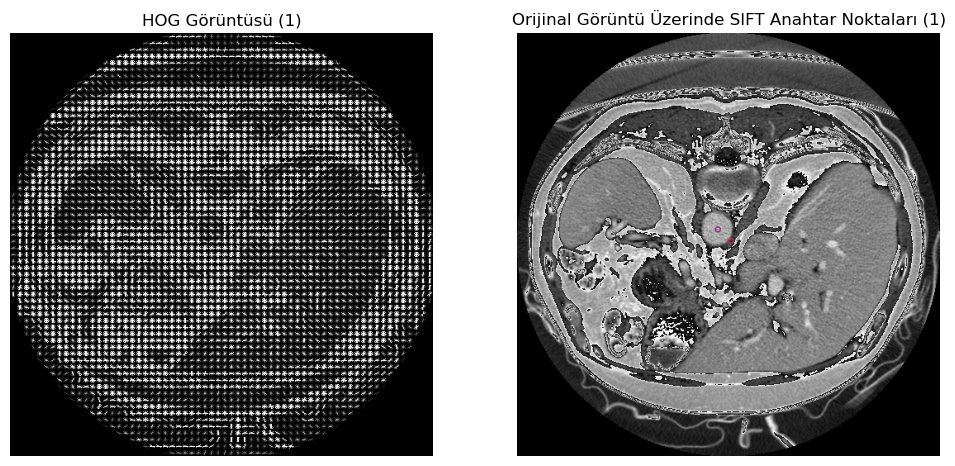

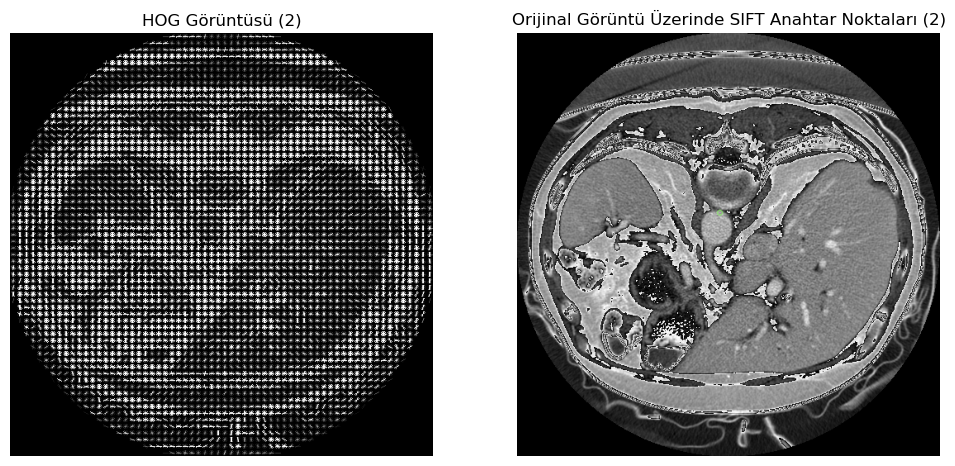

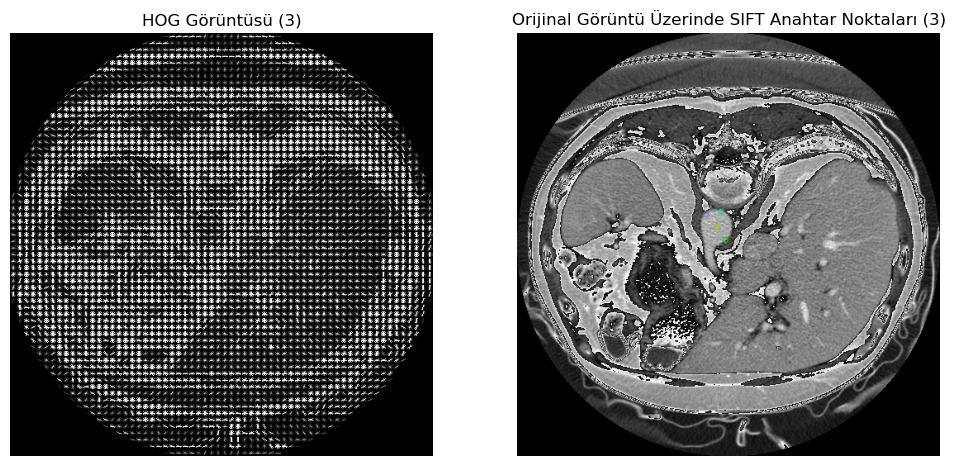

Veriler başarıyla kaydedildi: /Users/muzaffernergiz/Desktop/sift_hog_features.json


In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from skimage.feature import hog
from skimage import exposure

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Vektörleri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)

    # SIFT anahtar noktalarını tespit et
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(label_img, None)

    # Renkli görüntüyü gri tonlamalıya çevir
    original_gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

    # HOG Özellikleri Hesaplama
    fd, hog_image = hog(original_gray_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

    # HOG Görüntüsünü iyileştirme (daha net görmek için)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # Görselleştirme
    plt.figure(figsize=(12, 12))

    # HOG Görüntüsünü görselleştirme
    plt.subplot(1, 2, 1)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title(f"HOG Görüntüsü ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde SIFT Anahtar Noktalarını Çizme
    img_with_kp = cv2.drawKeypoints(original_img, kp, None)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_with_kp, cv2.COLOR_BGR2RGB))  # Renkli görüntüde çizilen alanları göster
    plt.title(f"Orijinal Görüntü Üzerinde SIFT Anahtar Noktaları ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Verileri kaydetme
    data_to_save.append({
        "image_index": idx + 1,
        "hog_features": fd.tolist(),  # HOG özelliklerini liste formatına çevir
        "hog_image": numpy_to_json_compatible(hog_image_rescaled),  # HOG görüntüsünü JSON uyumlu hale getir
        "sift_keypoints": [{"x": kp_pt.pt[0], "y": kp_pt.pt[1]} for kp_pt in kp],  # SIFT anahtar noktalarını JSON uyumlu hale getir
        "label_img": numpy_to_json_compatible(label_img),  # Label görüntüsünü JSON uyumlu hale getir
        "original_img": numpy_to_json_compatible(original_img)  # Orijinal görüntüyü JSON uyumlu hale getir
    })

# Verileri HDD'ye JSON olarak kaydetme
output_path = "/Users/muzaffernergiz/Desktop/sift_hog_features.json"
with open(output_path, 'w') as f:
    json.dump(data_to_save, f, indent=4)

print(f"Veriler başarıyla kaydedildi: {output_path}")


/var/folders/x4/4clmmtd53q30y140639dzwzh0000gn/T/ipykernel_10832/731317979.py:40: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)  # Köşe noktalarını tamsayıya dönüştür


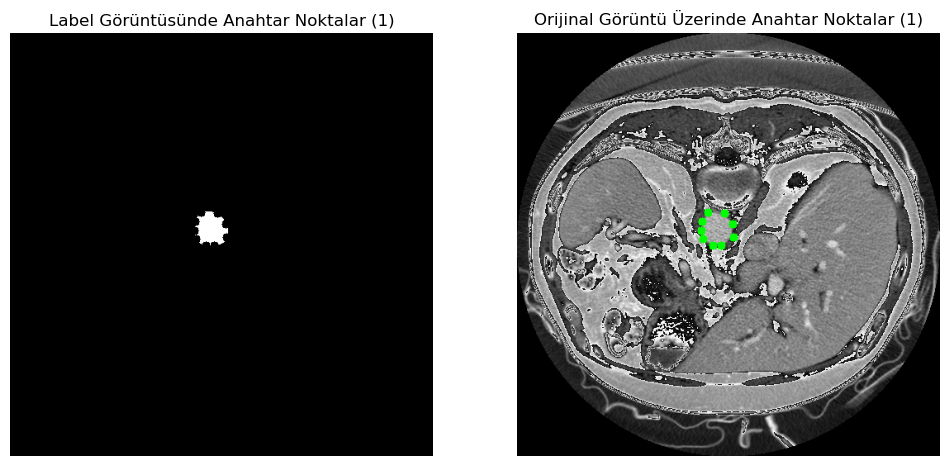

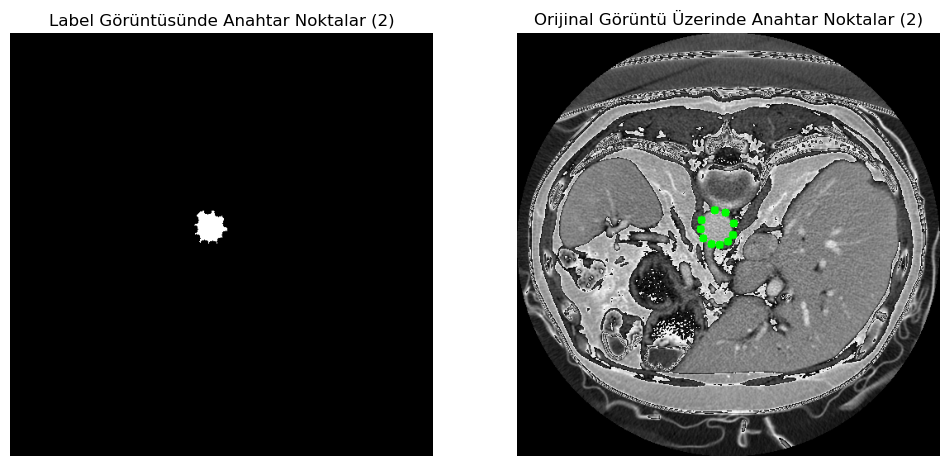

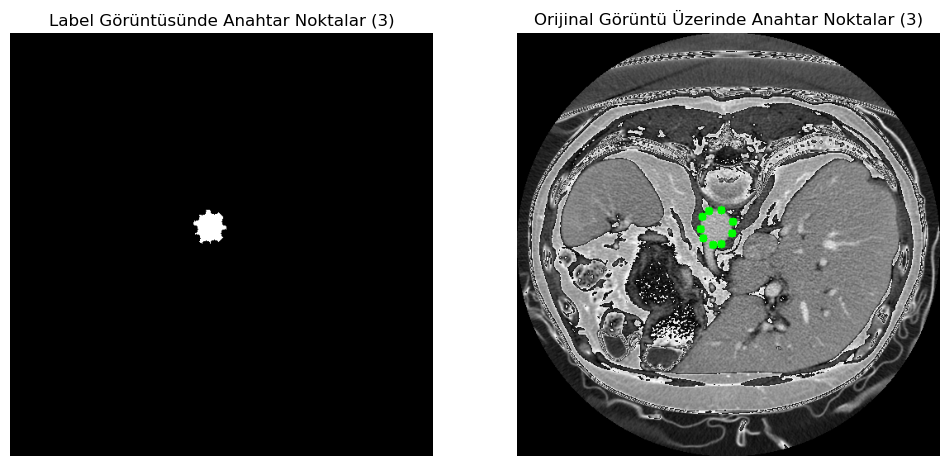

Veriler başarıyla kaydedildi: /Users/muzaffernergiz/Desktop/goodfeatures_keypoints.json


In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Verileri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)

    # GoodFeaturesToTrack ile köşe noktalarını tespit et
    corners = cv2.goodFeaturesToTrack(label_img, maxCorners=1000, qualityLevel=0.01, minDistance=10)

    # Eğer köşe noktaları tespit edilmişse
    if corners is not None:
        corners = np.int0(corners)  # Köşe noktalarını tamsayıya dönüştür
        keypoints = [{"x": int(corner[0][0]), "y": int(corner[0][1])} for corner in corners]

        # Anahtar noktalarını label görüntüsüne çizme
        for corner in corners:
            x, y = corner.ravel()
            cv2.circle(label_img, (x, y), 5, (0, 255, 0), -1)
            # Anahtar noktasını orijinal görüntüde de çizme
            cv2.circle(original_img, (x, y), 5, (0, 255, 0), -1)

    # Görselleştirme
    plt.figure(figsize=(12, 12))

    # Label Görüntüsü üzerinde Anahtar Noktalar
    plt.subplot(1, 2, 1)
    plt.imshow(label_img, cmap='gray')
    plt.title(f"Label Görüntüsünde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Anahtar Noktalar
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Orijinal Görüntü Üzerinde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Verileri kaydetme
    data_to_save.append({
        "image_index": idx + 1,
        "keypoints": keypoints,  # Anahtar noktalar
        "label_img": numpy_to_json_compatible(label_img),  # Label görüntüsünü JSON uyumlu hale getir
        "original_img": numpy_to_json_compatible(original_img)  # Orijinal görüntüyü JSON uyumlu hale getir
    })

# Verileri HDD'ye JSON olarak kaydetme
output_path = "/Users/muzaffernergiz/Desktop/goodfeatures_keypoints.json"
with open(output_path, 'w') as f:
    json.dump(data_to_save, f, indent=4)

print(f"Veriler başarıyla kaydedildi: {output_path}")


/var/folders/x4/4clmmtd53q30y140639dzwzh0000gn/T/ipykernel_10832/1647512970.py:41: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)  # Koordinatları tamsayıya çevir


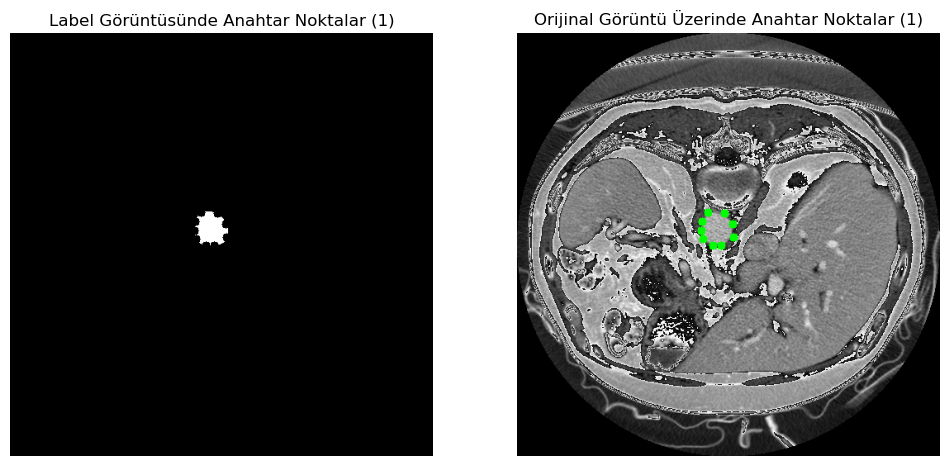

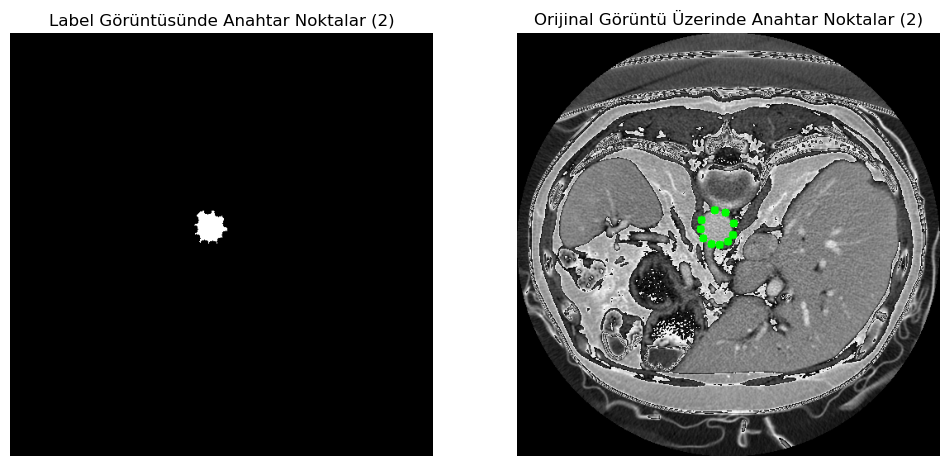

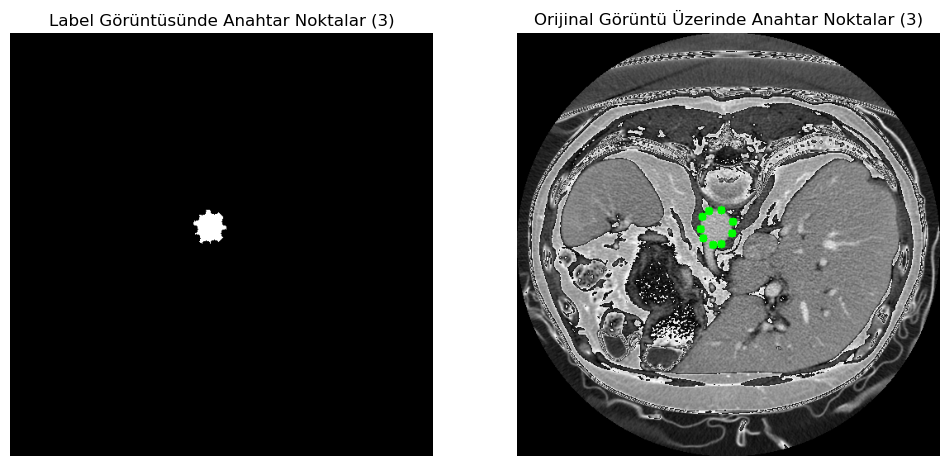

Veriler başarıyla kaydedildi: /Users/muzaffernergiz/Desktop/keypoints.json


In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Görüntü Yollarını Belirleme
label_dir = "/Users/muzaffernergiz/Desktop/5-aorta/labels"
image_dir = "/Users/muzaffernergiz/Desktop/5-aorta/images"

# Tüm dosya yollarını al ve sıralı şekilde ilk 3 tanesini seç
label_paths = [os.path.join(label_dir, f) for f in sorted(os.listdir(label_dir)) if f.endswith('.png')][:3]
original_paths = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith('.png')][:3]

# Verileri kaydetmek için liste
data_to_save = []

# İşleme ve Görselleştirme
for idx, (label_path, original_path) in enumerate(zip(label_paths, original_paths)):
    # Label ve orijinal görüntüyü yükle
    label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
    original_img = cv2.imread(original_path)

    # Anahtar noktaları tespit et
    corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)

    # Anahtar noktalar bulunursa, onları görselleştir
    keypoints = []
    if corners is not None:
        corners = np.int0(corners)  # Koordinatları tamsayıya çevir
        for corner in corners:
            x, y = corner.ravel()
            keypoints.append({"x": int(x), "y": int(y)})
            # Anahtar noktasını çizme (label üzerinde)
            cv2.circle(label_img, (x, y), 5, (0, 255, 0), -1)
            # Anahtar noktasını orijinal görüntüde de çizme
            cv2.circle(original_img, (x, y), 5, (0, 255, 0), -1)

    # Görselleştirme
    plt.figure(figsize=(12, 12))

    # Label Görüntüsünde Anahtar Noktaları Çizme
    plt.subplot(1, 2, 1)
    plt.imshow(label_img, cmap='gray')
    plt.title(f"Label Görüntüsünde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    # Orijinal Görüntü üzerinde Anahtar Noktaları Çizme
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Orijinal Görüntü Üzerinde Anahtar Noktalar ({idx + 1})")
    plt.axis('off')

    plt.show()

    # Verileri kaydetme
    data_to_save.append({
        "image_index": idx + 1,
        "keypoints": keypoints,  # Anahtar noktalar
        "label_img": numpy_to_json_compatible(label_img),  # Label görüntüsünü JSON uyumlu hale getir
        "original_img": numpy_to_json_compatible(original_img)  # Orijinal görüntüyü JSON uyumlu hale getir
    })

# Verileri HDD'ye JSON olarak kaydetme
output_path = "/Users/muzaffernergiz/Desktop/keypoints.json"
with open(output_path, 'w') as f:
    json.dump(data_to_save, f, indent=4)

print(f"Veriler başarıyla kaydedildi: {output_path}")


In [31]:
import cv2
import numpy as np
import os
import json
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# JSON uyumlu hale getirme
def numpy_to_json_compatible(obj):
    if isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, np.generic):
        return obj.item()
    elif isinstance(obj, (int, float, str, bool)): 
        return obj
    else:
        raise TypeError(f"Object of type {type(obj)} is not JSON serializable")

# Verileri yükleme ve işleme
def extract_features_and_keypoints(image_paths, label_paths):
    features = []
    keypoints_data = []

    for idx, (label_path, original_path) in enumerate(zip(label_paths, image_paths)):
        label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
        original_img = cv2.imread(original_path)

        # Anahtar noktaları tespit et
        corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
        keypoints = []

        # Anahtar noktaları ve vektör özelliklerini çıkar
        if corners is not None:
            corners = np.intp(corners)  # np.intp kullanımı ile uyarıdan kaçınılır
            for corner in corners:
                x, y = corner.ravel()
                keypoints.append({"x": int(x), "y": int(y)})

        # Vektör Özellikleri (örnek olarak sadece anahtar nokta sayısını alıyoruz)
        features.append([len(keypoints)])  # Anahtar nokta sayısı, basit özellik olarak
        keypoints_data.append(keypoints)
    
    return features, keypoints_data

# Eğitim verisini yükleme (önceden kaydedilen)
train_image_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_62.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_63.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_64.png"
]
train_label_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_62.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_63.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_64.png"
]

# Özellikleri ve anahtar noktaları çıkar
X_train, _ = extract_features_and_keypoints(train_image_paths, train_label_paths)

# Eğitim etiketlerini belirleme (örneğin, 0 veya 1 gibi etiketler)
y_train = [0, 1, 0]  # Bu etiketlerinizi özelleştirin

# Modeli eğitme
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

# Yeni 3 fotoğraf için özellik çıkartma
test_image_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_64.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_65.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_66.png"
]
test_label_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_64.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_65.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_66.png"
]

# Yeni fotoğraflar için tahmin yapma
X_test, _ = extract_features_and_keypoints(test_image_paths, test_label_paths)

# Tahmin yapma
y_pred = model.predict(X_test)

# Sonuçları yazdırma
for idx, prediction in enumerate(y_pred):
    print(f"Test Fotoğraf {idx + 1}: {prediction}")

import joblib

# Modeli kaydetme
joblib.dump(model, 'model.pkl')

# Modeli yükleme (gelecekte kullanmak için)
loaded_model = joblib.load('model.pkl')



Test Fotoğraf 1: 0
Test Fotoğraf 2: 0
Test Fotoğraf 3: 1


In [35]:
import cv2
import numpy as np
import joblib
import matplotlib.pyplot as plt
from skimage.feature import hog

# Anahtar noktaları ve basit özellikler çıkarma
def extract_features_and_keypoints(image_paths, label_paths):
    features = []
    keypoints_data = []

    for idx, (label_path, original_path) in enumerate(zip(label_paths, image_paths)):
        label_img = cv2.imread(label_path, cv2.IMREAD_GRAYSCALE)
        original_img = cv2.imread(original_path)

        # Anahtar noktaları tespit et
        corners = cv2.goodFeaturesToTrack(label_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
        keypoints = []

        # Anahtar noktaları çıkar
        if corners is not None:
            corners = np.int0(corners)
            for corner in corners:
                x, y = corner.ravel()
                keypoints.append({"x": int(x), "y": int(y)})

        # Vektör Özellikleri: Anahtar nokta sayısı
        keypoint_count = len(keypoints)
        
        # Özellik vektörünü oluştur
        features.append([keypoint_count])
        keypoints_data.append(keypoints)

    return features, keypoints_data

# Modeli yükle
model = joblib.load('random_forest_model.pkl')

# Yeni 3 fotoğraf için özellik çıkartma
test_image_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_64.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_65.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/images/FLARE22_Tr_0001_slice_66.png"
]
test_label_paths = [
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_64.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_65.png", 
    "/Users/muzaffernergiz/Desktop/5-aorta/labels/FLARE22_Tr_0001_slice_66.png"
]

# Yeni fotoğraflar için özellik çıkartma
X_test, keypoints_data = extract_features_and_keypoints(test_image_paths, test_label_paths)

# Tahmin yapma
y_pred = model.predict(X_test)

# Sonuçları yazdırma ve görselleştirme
for idx, (prediction, keypoints, image_path) in enumerate(zip(y_pred, keypoints_data, test_image_paths)):
    print(f"Test Fotoğraf {idx + 1}: {prediction}")

    # Görüntüyü yükle ve anahtar noktaları çiz
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Anahtar noktaları çizme
    for keypoint in keypoints:
        x, y = keypoint["x"], keypoint["y"]
        cv2.circle(img, (x, y), 5, (255, 0, 0), -1)  # Anahtar noktaları mavi ile çiz
    
    # Tahmin edilen sonucu görselleştirme
    cv2.putText(img, f'Tahmin: {prediction}', (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)

    # Görselleştirme
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"Test Fotoğraf {idx + 1} - Tahmin: {prediction}")
    plt.axis('off')
    plt.show()


/var/folders/x4/4clmmtd53q30y140639dzwzh0000gn/T/ipykernel_10832/405447088.py:22: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


ValueError: X has 1 features, but RandomForestClassifier is expecting 9 features as input.